**ESCUELA DE INGENIERÍA MECATRÓNICA**

## `PROCESAMIENTO DIGITAL DE SEÑALES E IMÁGENES`

### `Docente: Ms. Ing. Emerson Maximo Asto Rodriguez`

```
Práctica 7A: Filtrado en el espacio
```

INTEGRANTES
- Carlos Miranda, Jorge Augusto
- Valencia Romero, Natalia Brillit
- Velásquez Zegarra, Víctor Manuel

### 1. Implemente un algoritmo que permita realizar la correlacion 2D de una imagen de MxN con una mascara de mxn
* El algoritmo debe retornar una imagen de las mismas dimensiones que la imagen de entrada, recuerde que el "padding" usualmente se hace con ceros, no obstante se puede duplicar filas o columnas del borde, o hacerlo mediante un espejo sobre el borde.*

* El algoritmo tambien puede obtener la solución sin necesidad del "padding", agregando varias condicionales que permitan solo ponderar con los datos coincidentes.*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
!pwd

/content


In [ ]:
def filtro_espacial(imagen, filtro):
    M, N = imagen.shape #Obteniendo las dimensiones de la imagen
    m, n = filtro.shape #Obteniendo las dimensiones del filtro

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * filtro
            resultado[i-filas_add, j-columnas_add] = np.sum(multiplicacion)

    return resultado

1. ¿Por qué es importante el uso de técnicas de padding en la aplicación de filtros espaciales?
- El padding es importante para que la salida sea de las mismas dimensiones que la entrada. Se le agrega un "marco" de ceros a la imagen.
2. Explica qué es un kernel (o máscara) en un filtro espacial y cómo influye su tamaño en el procesamiento de imágenes.
- El kernel es un filtro que va pasando por toda la imagen, su función es extraer características de la imagen. Su tamaño puede influir en el resultado ya que si tenemos una imagen de 5x5 y un kernel de 3x3, la salida será de 3x3, perdiendo datos de la imagen original; si la imagen es 5x5 y el kernel 5x5, la salida será de 1x1. Es por eso que se usa el padding.

In [ ]:
img = np.arange(100).reshape(10,10)
filtro = np.ones((5,7))

print(img)
print(filtro)

img_filtrada = filtro_espacial(img, filtro)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47 48 49]
 [50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69]
 [70 71 72 73 74 75 76 77 78 79]
 [80 81 82 83 84 85 86 87 88 89]
 [90 91 92 93 94 95 96 97 98 99]]
[[1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]]


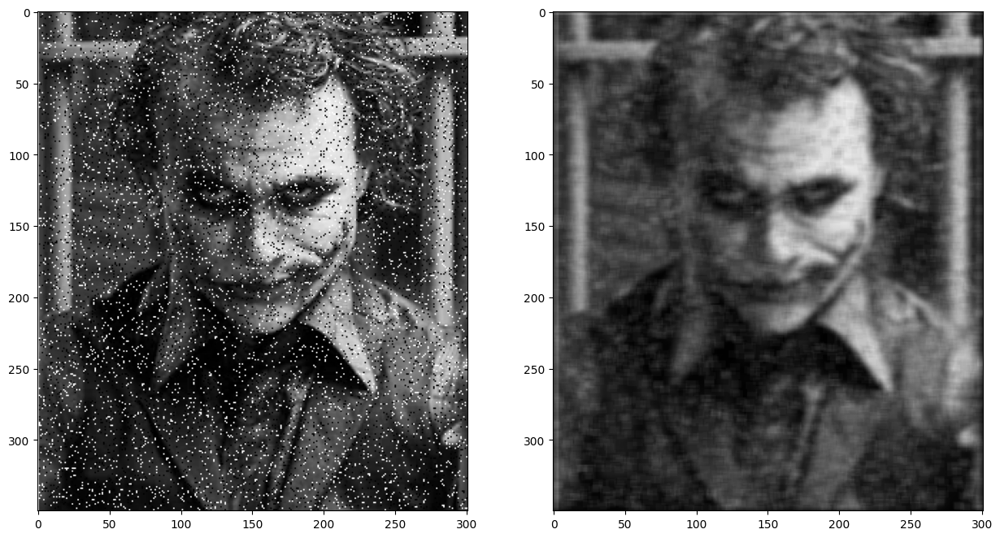

In [ ]:
img_ruido = cv2.imread('./Imagenes/ruido.png', 0)/255

filtro = np.ones((5,7))
filtro = filtro/np.sum(filtro)

img_ruido_filtrada = filtro_espacial(img_ruido, filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_ruido, cmap='gray')
plt.subplot(122)
plt.imshow(img_ruido_filtrada, cmap='gray', vmin=0, vmax=1)
plt.show()

### 2.- Implemente un algoritmo que permita mejorar solo los pixeles oscuros y de bajo contraste
*Puede modificar levemente el algoritmo realizado en el enunciado **1** para lograr el objetivo*

In [ ]:
def filtro_espacial_estadistico(imagen, selem = np.ones((3,3))):
    media_global = np.mean(imagen)
    desv_global = np.std(imagen)

    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            media_loc = np.mean(multiplicacion)
            desv_loc = np.std(multiplicacion)

            if (media_loc<media_global) and (desv_loc<0.8*desv_global) and (desv_loc>0.2*desv_global):
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]*1.5
            else:
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]

    return resultado

1. ¿Cuál es el objetivo de este algoritmo y qué tipo de imágenes se benefician más de su aplicación?
2. Vecindad y Kernel: ¿Cómo se define la vecindad de un píxel en este código y cuál es la importancia de la variable selem en este contexto?
3. ¿Qué efecto tiene el factor de escala de 1.5 en los píxeles mejorados y cómo podría ajustarse para obtener diferentes resultados?

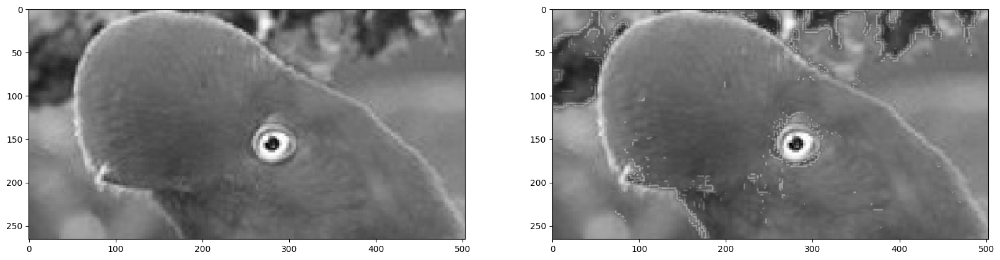

In [ ]:
img_delfin = np.uint16(cv2.imread('./Imagenes/template.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 3.- Implemente los filtros estadisticos min, max, moda y mediana


In [ ]:
from scipy.stats import mode

def filtro_espacial_estadistico(imagen, selem = np.ones((3,3)), filter_type='median'):
    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

#     img_pad = np.zeros((M+ filas_adicionales*2, N + columnas_adicionales*2))
    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            if filter_type =='min':
                resultado[i-filas_add, j-columnas_add] = np.min(multiplicacion)
            elif filter_type == 'max':
                resultado[i-filas_add, j-columnas_add] = np.max(multiplicacion)
            elif filter_type == 'median':
                resultado[i-filas_add, j-columnas_add] = np.median(multiplicacion)
            elif filter_type == 'mode':
                resultado[i-filas_add, j-columnas_add] = mode(multiplicacion, axis=None)[0]

    return resultado

**1. ¿Qué es un filtro estadístico en el procesamiento de imágenes y cómo se aplica en el código mostrado?**
Un filtro estadístico en procesamiento de imágenes es una operación que aplica una función estadística en una vecindad de píxeles alrededor de cada píxel de la imagen. En el código mostrado, se extrae las dimensiones de la imagen original y se extraen las dimensiones del filtro 3x3, se agregan filas y columnas necesarias para añadir un borde a la imagen original y se pueda aplicar el filtro en los bordes de la imagen original. Se crea una variable resultado, inicializada con ceros, la cual servirá para almacenar la imagen ya filtrada. Se recorre cada píxel de la imagen con los bucles for, sin considerar el borde añadido. Se extrae la vecindad, se multiplica por el filtro y según el tipo de filtro definido, se aplica la función estadística deseada.Finalmente se retorna el resultado, la imagen ya filtrada.

**2. ¿Qué diferencias existen entre los filtros de tipo min, max, median y mode? Explica en qué situaciones sería adecuado usar cada tipo.**

Filtro Min: Reemplaza cada píxel con el valor mínimo de su vecindad. Tiende a oscurecer la imagen y puede reducir ruido de alta intensidad, como puntos brillantes. Útil cuando se desea reducir ruido brillante (píxeles con valores altos) en una imagen.

Filtro Max: Reemplaza cada píxel con el valor máximo de su vecindad. Tiende a aclarar la imagen y es útil para eliminar ruido de baja intensidad, como puntos oscuros. Adecuado para eliminar ruido oscuro (píxeles con valores bajos) en imágenes.

Filtro Median: Reemplaza cada píxel con el valor mediano de su vecindad. Es efectivo para reducir ruido tipo "sal y pimienta", ya que los valores extremos no afectan el cálculo tanto como en los filtros mínimo o máximo. Especialmente útil para reducir el ruido tipo "sal y pimienta", donde los valores extremos se intercalan en la imagen.

Filtro Mode: Reemplaza cada píxel con el valor más frecuente (moda) en su vecindad. Este filtro es útil en imágenes con regiones homogéneas, donde el valor predominante representa mejor el entorno. Adecuado para imágenes con áreas de color sólido o donde existe una alta frecuencia de píxeles similares.

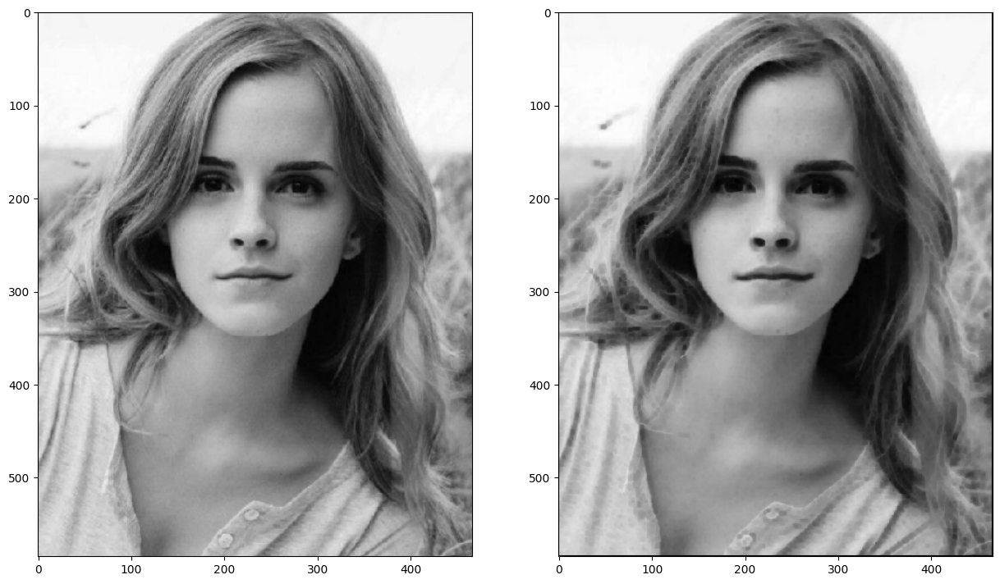

In [ ]:
#MINIMO
img_delfin = np.uint16(cv2.imread('./Imagenes/emma.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type = 'min')
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


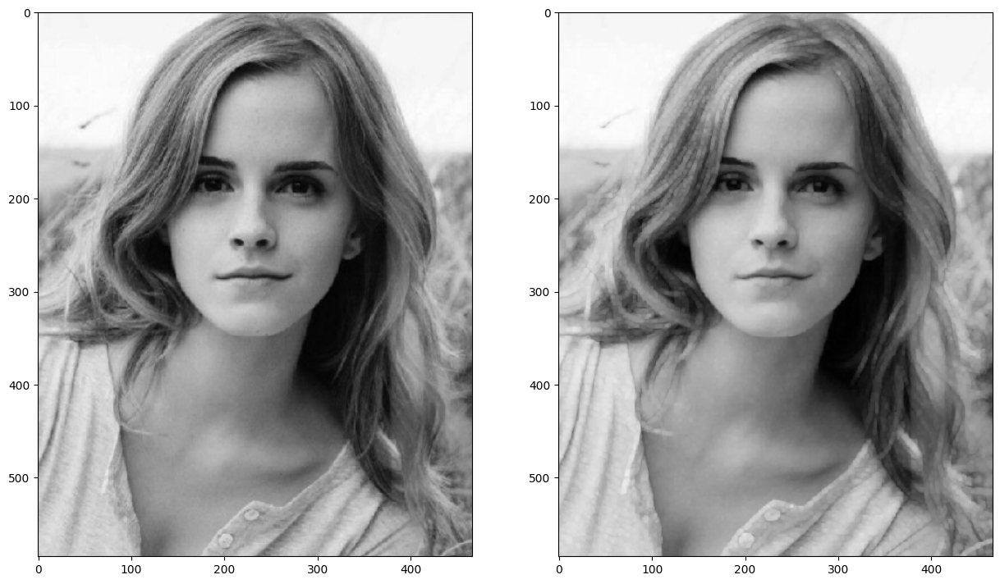

In [ ]:
#MAX
img_delfin = np.uint16(cv2.imread('./Imagenes/emma.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin, filter_type = 'max')
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

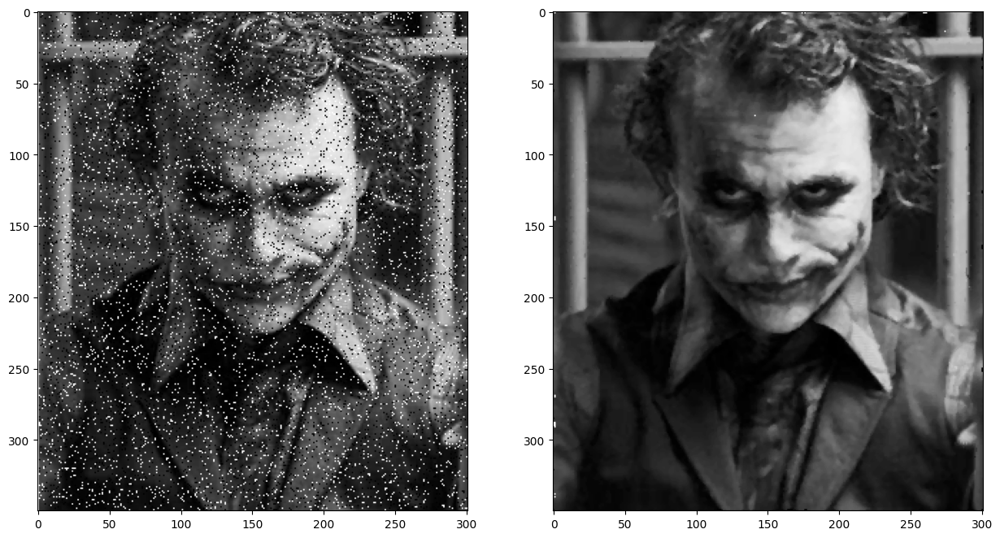

In [ ]:
#MEDIANA
img_delfin = np.uint16(cv2.imread('./Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

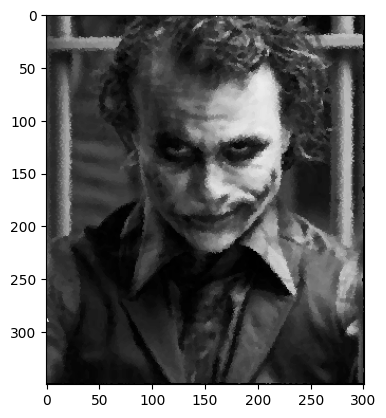

In [ ]:
img_median_mode = filtro_espacial_estadistico(img_delfin_filtrada, filter_type='mode')
plt.imshow(img_median_mode, cmap='gray')
plt.show()

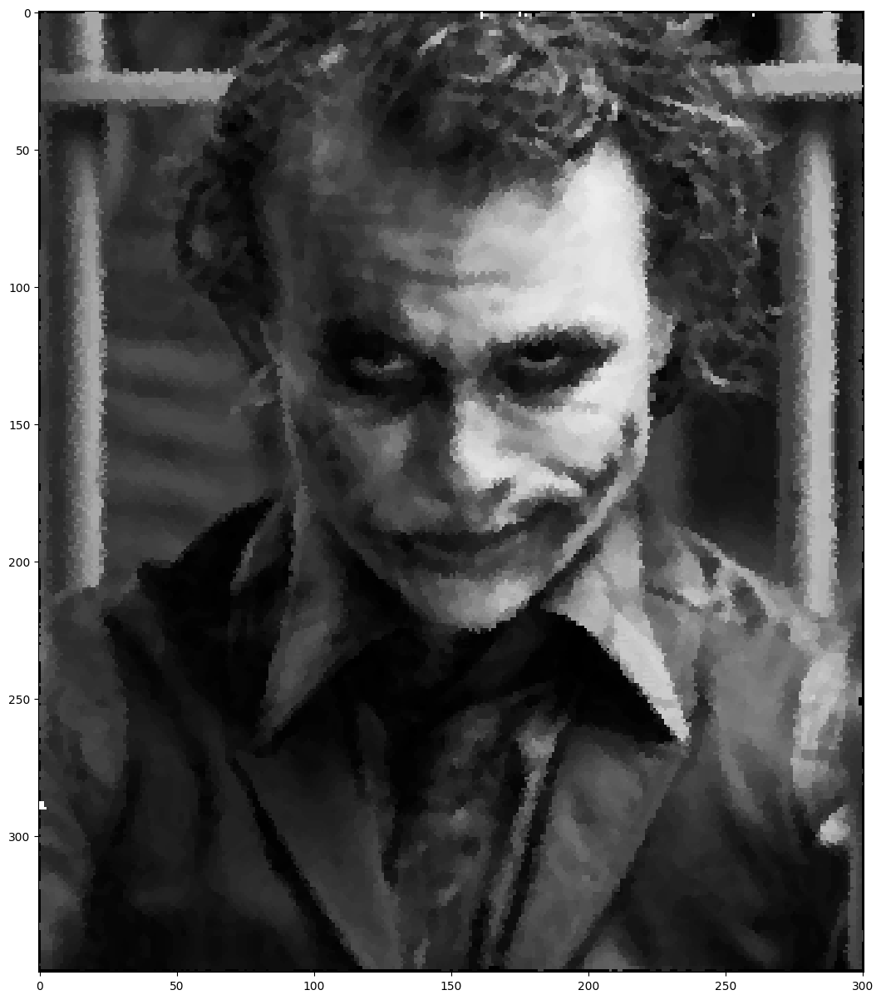

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img_median_mode, cmap='gray')
plt.show()

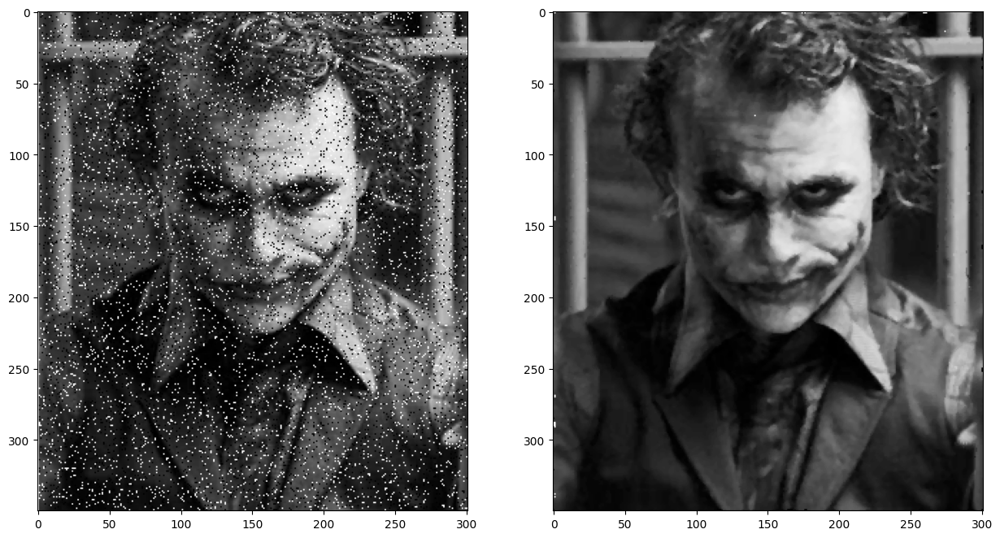

In [ ]:
#MODA
img_delfin = np.uint16(cv2.imread('./Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 4.- Implemente los filtros espaciales de suavizado y nitidez explicados en clase

Utilizando la funcion **convolve2d(img, kernel, mode= "same")** de **scipy.signal** y los kernels:
(tambien se puede usar **correlate2d**)
* Promedio
* Gaussiano
* Laplaciano


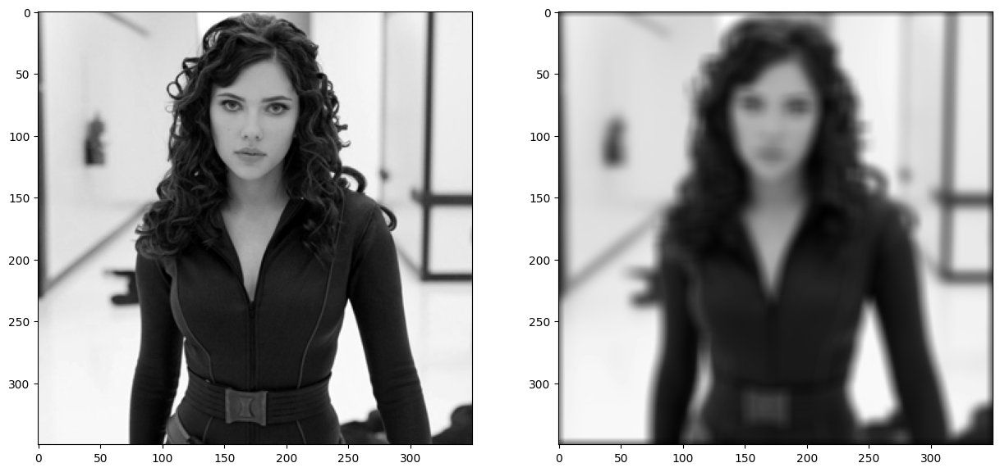

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("./Imagenes/scarlett_oc.png", 0)/255
kernel = np.ones((11,11))/121

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

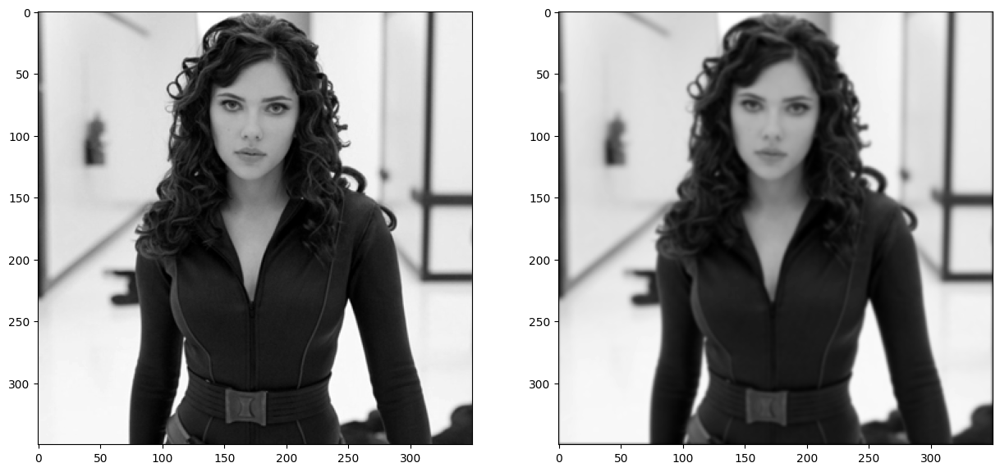

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("./Imagenes/scarlett_oc.png", 0)/255
# kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16
kernel = np.array([1,4,7,4,1])*np.array([[1],[4],[7],[4],[1]])
kernel = kernel/np.sum(kernel)

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

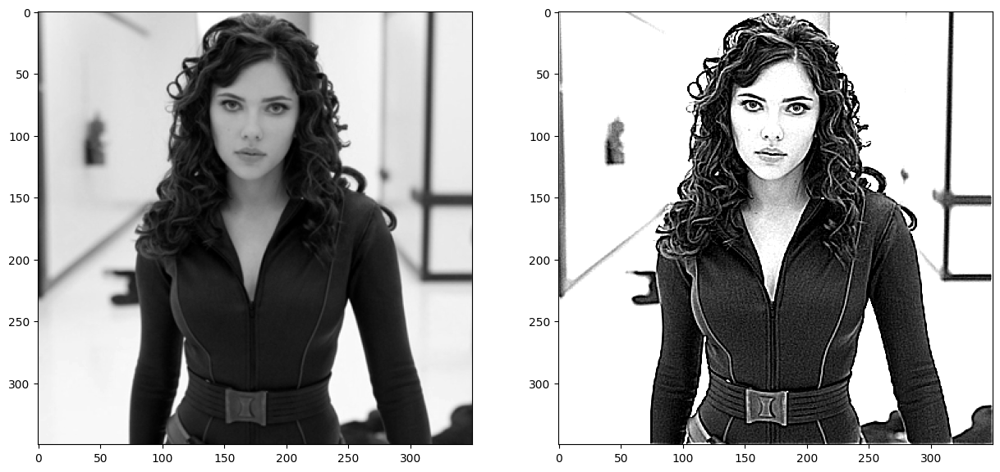

In [ ]:
#LAPLACIANO
from scipy import signal
A = 1.5
img = cv2.imread("./Imagenes/scarlett_oc.png", 0)/255
kernel = np.array([[-1,-1,-1], [-1,A+8,-1], [-1,-1,-1]])

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

**Utilizando OpenCV:**
* cv2.blur(img, (Tamaño_kernel))
* cv2.GaussianBlur(img,(Tamaño_kernel),desviacion_estandar)
* cv2.medianBlur(img,Tamaño_kernel)
* cv2.bilateralFilter(img,tamaño_kernel,sigmacolor,sigmaspace)  [Mas info](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html)

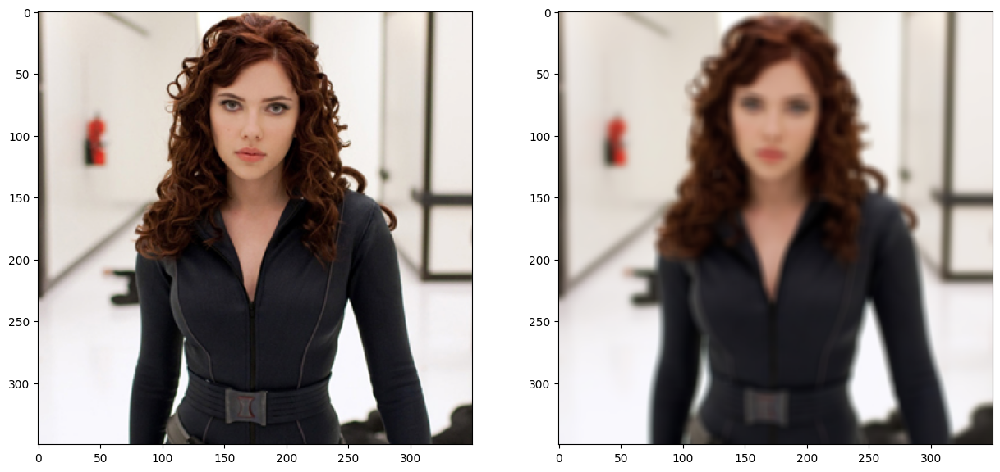

In [ ]:
img = cv2.imread("./Imagenes/scarlett_oc.png")[..., ::-1]

out = cv2.blur(img, (7,7))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

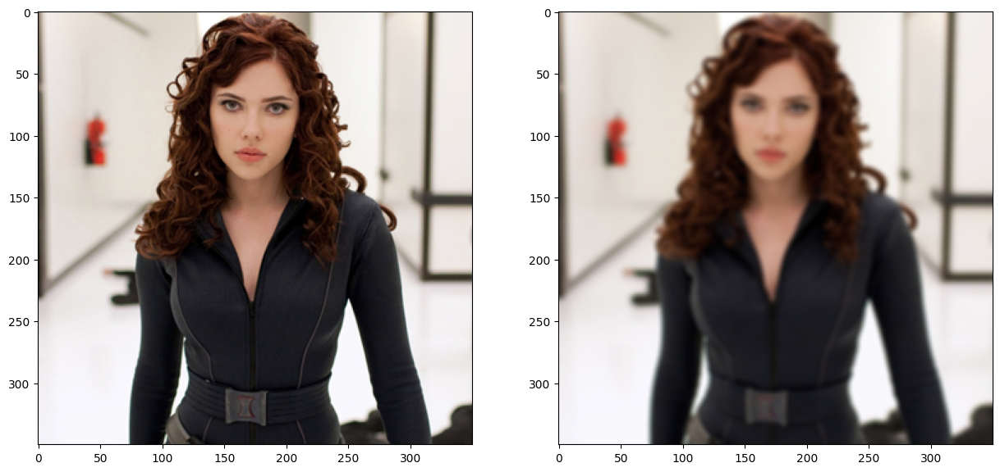

In [ ]:
out = cv2.GaussianBlur(img,(7,7), 2)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

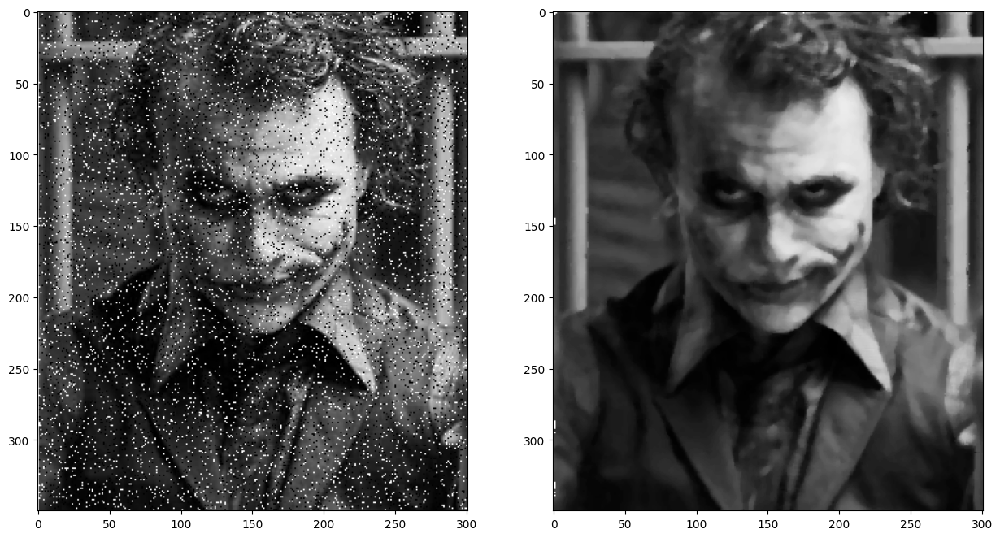

In [ ]:
img_joker = cv2.imread('./Imagenes/ruido.png')[..., ::-1]

img_joker_filtrada = cv2.medianBlur(img_delfin, 5) # (,tamaño del filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_joker, cmap='gray')
plt.subplot(122)
plt.imshow(img_joker_filtrada, cmap='gray')
plt.show()

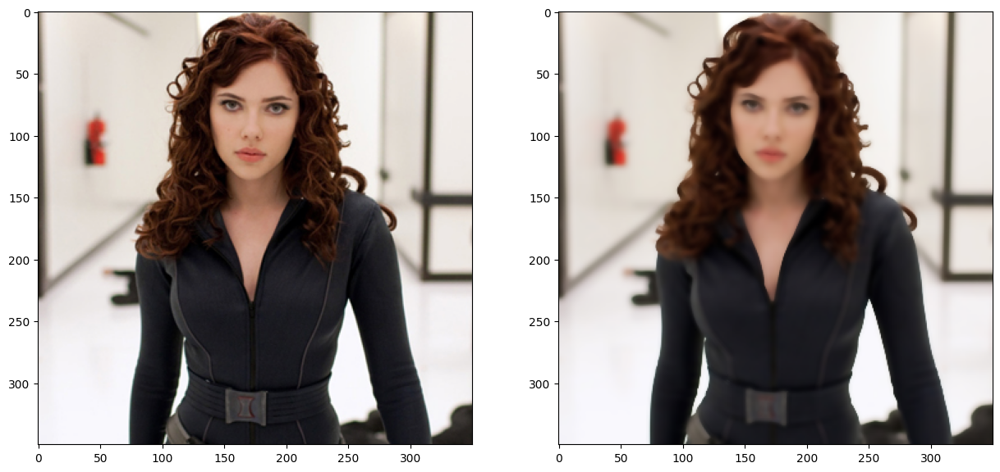

In [ ]:
out = cv2.bilateralFilter(img,7, 160, 160)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la diferencia fundamental entre los filtros de suavizado (como el de promedio y el Gaussiano) y los filtros de nitidez (como el Laplaciano)?
La diferencia principal en estos filtros radica en que tanto reducen el ruido suavizan la imagen, se puede decir que el filtro Gaussiano elimina menos los detalles finos y bordes que el promedio. Por otra parte, los filtros de nitidez resaltan los bordes y detalles finos, mejorando la definición de la imagen.

2. ¿Cuáles son las principales diferencias en los resultados obtenidos al aplicar un filtro de promedio versus un filtro Gaussiano?
Un filtro promedio suaviza de manera uniforme una imagen, pero suele difuminar los bordes mientras que un filtro Gaussiano suaviza pero teniendo un poco más de control, preservando mejor los bordes y detalles.

3. ¿Qué propiedades tiene el kernel Laplaciano y cómo contribuye a la nitidez de la imagen? ¿Qué efectos visuales produce al aplicarse a una imagen?
El kernel Laplaciano resalta los bordes al detectar cambios rápidos de intensidad. Lo que produce una imagen más nítida, pero que puede sobresaturar los bordes. Este kernel es útil para mejorar el contraste y realzar detalles.

4. ¿Qué significa el argumento mode="same" en la función convolve2d y cómo afecta el tamaño de la imagen resultante después de aplicar el filtro?

   mode="same" especifica cómo se manejarán los bordes de la imagen al aplicar el filtro (kernel).Cuando mode="same", la función ajusta la salida para que tenga el mismo tamaño que la imagen de entrada. Esto significa que los píxeles en los bordes de la imagen se procesan utilizando valores de relleno o padding, de forma que la imagen resultante no se reduzca en tamaño.





### 5.- Implemente un algoritmo para muestre el uso de la mascara de desenfoque (unsharp mask) y el filtro de altoaumento (Highboost)

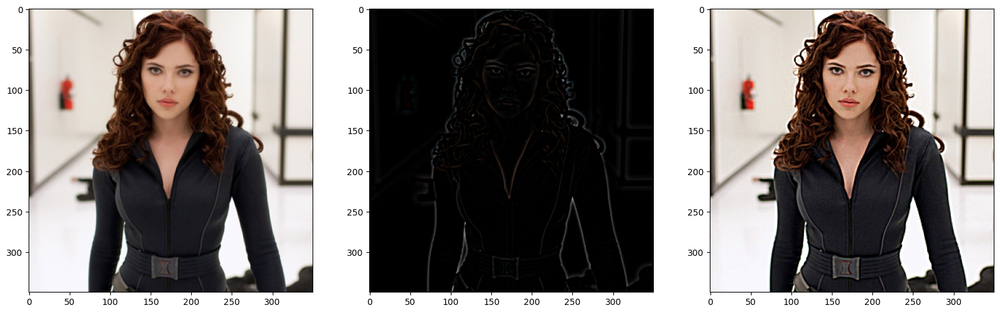

In [ ]:
img = cv2.imread("./Imagenes/scarlett_oc.png")[..., ::-1]/255

blur = cv2.blur(img, (7,7))

mask = img - blur

unsharp_image = mask + img

plt.figure(figsize=(20,15))
plt.subplot(131)
plt.imshow(img, cmap="gray")
plt.subplot(132)
plt.imshow(mask, cmap="gray")
plt.subplot(133)
plt.imshow(unsharp_image, cmap='gray', vmin=0, vmax=1)
plt.show()

1. ¿Cómo funciona la máscara de desenfoque (unsharp mask) para realzar los detalles de una imagen, y cuál es el papel del filtro de suavizado en este proceso?

 La técnica de máscara de desenfoque o unsharp mask se utiliza para realzar los detalles y los bordes en una imagen, dándole una apariencia más nítida.

 El papel del filtro de suavizado es esencial para crear la máscara. Sin el suavizado, no podríamos aislar los detalles finos de la imagen, y, por lo tanto, no se podría generar el efecto de realce.

2.  ¿En qué se diferencia el filtro de alto aumento (Highboost) de la máscara de desenfoque estándar, y cómo se puede ajustar el factor de amplificación (boosting factor) para controlar el nivel de realce en la imagen?

 La máscara de desenfoque realza detalles de manera fija, simplemente sumando la máscara a la imagen original. El filtro de alto aumento permite controlar el nivel de realce mediante el factor de amplificación 𝐴, dándote mayor flexibilidad para ajustar el efecto.

 El valor de A (factor de amplificación) determina la intensidad del realce:

 Si 𝐴=1: El filtro de alto aumento se comporta como la máscara de desenfoque estándar, con un realce básico.

 Si 𝐴>1: La contribución de la máscara se multiplica, y los detalles se vuelven más pronunciados. Cuanto mayor sea A, más nítida y contrastada será la imagen. Sin embargo, un valor demasiado alto de A puede introducir artefactos y hacer que la imagen se vea artificial.

 Un valor entre 1 y 2 generalmente ofrece un realce leve a moderado, suficiente para mejorar detalles sin exagerarlos.

 Valores mayores a 2 incrementan aún más el realce, pero pueden hacer que la imagen se vea poco natural o con ruido si el aumento es excesivo.


### 6.- Implemente un algoritmo para mostrar la gradiente de una imagen
**Use las mascaras:**
* Roberts
* Prewit
* Sobel
* Scharr

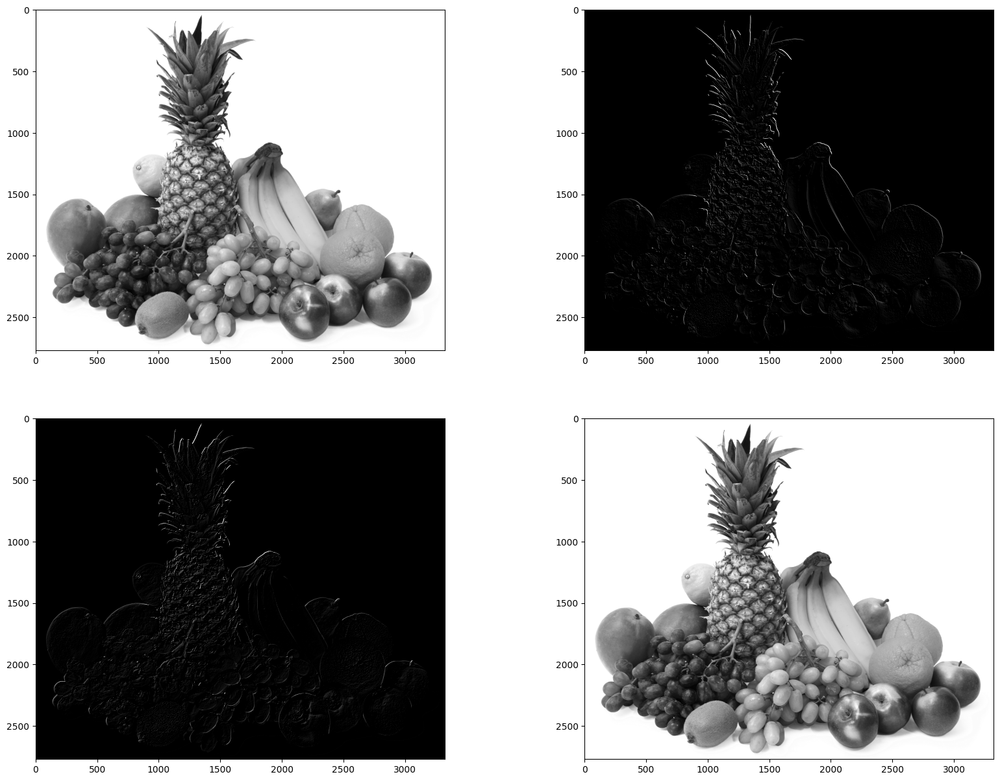

In [ ]:
#ROBERTS
img = cv2.imread("./Imagenes/frutas.jpg", 0)/255

kernelh = np.array([[0,-1],[1,0]])
kernelv = np.array([[-1,0],[0,1]])

outh = signal.convolve2d(img, kernelh, mode= "same")
outv = signal.convolve2d(img, kernelv, mode= "same")

outf = outh + outv

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img, cmap="gray")
plt.subplot(222)
plt.imshow(outh * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(223)
plt.imshow(outv * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(224)
plt.imshow(outf + img, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la característica distintiva de la máscara de Roberts al calcular el gradiente de una imagen, y por qué podría ser menos precisa que otras máscaras?

 La máscara de Roberts es un operador de detección de bordes que calcula el gradiente de intensidad en una imagen utilizando dos pequeñas máscaras de
 2×2. Su característica distintiva es que calcula la magnitud del gradiente en la dirección diagonal, a diferencia de otros operadores que suelen calcular el gradiente en las direcciones horizontales y verticales.Sin embargo, debido a su tamaño reducido y su falta de suavizado, es menos precisa y más susceptible al ruido en comparación con otros operadores de gradiente como Sobel o Prewitt.


2. ¿Cómo afectan las máscaras de Sobel y Scharr a la precisión y sensibilidad en la detección de bordes en una imagen? ¿En qué casos se prefiere una sobre la otra?

 Las máscaras de Sobel y Scharr son operadores de detección de bordes que calculan el gradiente de intensidad en una imagen, ayudando a resaltar los bordes o cambios abruptos de intensidad. Ambos operadores funcionan sobre ventanas de 3x3 y son más robustos contra el ruido en comparación con máscaras más pequeñas como la de Roberts.

*   Sobel es una elección más común y general, menos sensible al ruido y adecuada para bordes bien definidos.
*   Scharr es más precisa y sensible a cambios sutiles, ideal para aplicaciones detalladas y cuando es fundamental captar transiciones suaves en los bordes.

 En términos de implementación, Scharr se usa cuando la precisión adicional justifica el ligero aumento en el costo computacional respecto a Sobel.
